# Credit Card Fraud Detection

#### Source: https://www.kaggle.com/mlg-ulb/creditcardfraud
A coding done in this notebook has been taken from my own Github as reference. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from yellowbrick.classifier import(ClassificationReport,
                                  DiscriminationThreshold)

In [2]:
df=pd.read_csv(r"C:\Users\gnr04\Desktop\Credit Card Fraud Detection\creditcard.csv")

In [3]:
df.shape

(284807, 31)

In [4]:
df.head()

#Features V1-V28 have been PCA trasnformed to maintain confidentiality of customer data.

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [23]:
max(df['Amount'])

25691.16

In [40]:
len(df.loc[df['Amount'] <200] )# Almost 80% of the data has Amount value less than £200.

255492

In [5]:
(df['Class'].value_counts()/len(df))*100

#Extremely imbalanced dataset.
#Any class where the class ratio is 1:10 or smaller can be termed as an imbalanced dataset.
# Less than 1% of the data contains fraud transactions.

#Section lecture 10.

0    99.827251
1     0.172749
Name: Class, dtype: float64

In [6]:
len(df[df['Class']==1])

# 492 observations are the fraudulent transactions(minority class)

492

In [7]:
df.info()

## No categorical variables

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [8]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [9]:
df.isna().sum()

#Fortunately no Null-values exist in this dataset.

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [20]:
#df['Class'].plot(kind='hist') # Class distribution plot.

Text(0.5, 1.0, 'Fraud Class Distributions \n (0: Non Fraud || 1: Fraud)')

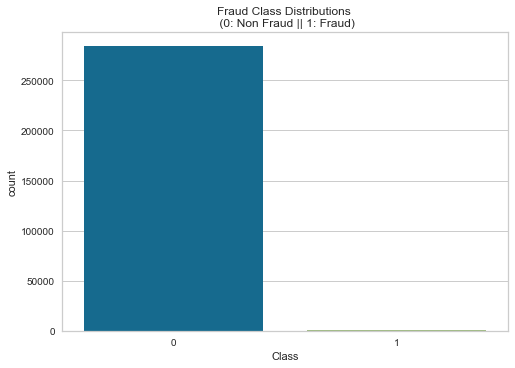

In [21]:
#colors = ["#0101DF", "#DF0101"]

sns.countplot('Class', data=df)
plt.title('Fraud Class Distributions \n (0: Non Fraud || 1: Fraud)')

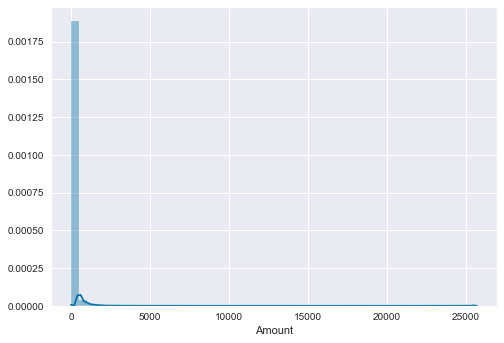

In [11]:
sns.set_style('darkgrid')
sns.distplot(df['Amount'])

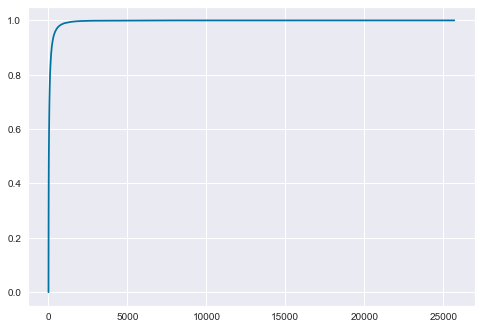

In [12]:
import plotly.offline as py
import plotly.graph_objs as go
import plotly.express as px


from scipy.stats import norm

x=np.sort(df['Amount'])
y=np.arange(1,len(x)+1)/len(x)
cdf=plt.plot(x,y)

# The CDF says that more than 80% of the data lies below 300.

#https://plotly.com/python/line-charts/

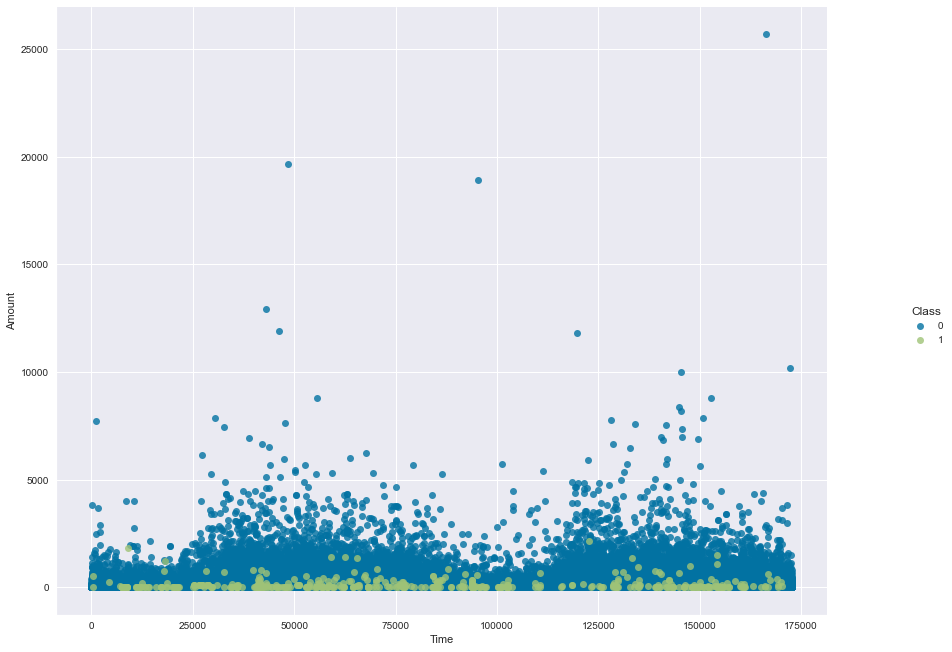

In [13]:
sns.lmplot('Time', 'Amount', df, hue='Class', fit_reg=False)
fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.show()

#https://datascience.stackexchange.com/questions/33780/scatter-plot-for-binary-class-dataset-with-two-features-in-python

# Data Splitting

1. Splitting the data into Train and Test.
2. All the EDA and model training will be carried out on the train dataset.

In [5]:


from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df.drop(labels=['Class'], axis=1), df['Class'], test_size=0.3,
                                                    random_state=12)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

# A total of almost 200k data is present in the training set and 85k in the test set.

((199364, 30), (85443, 30), (199364,), (85443,))

In [6]:
y_train.value_counts()
# Only 345 fraud instances has been found in the training dataset.

0    199019
1       345
Name: Class, dtype: int64

## Outlier Detection

In [12]:
import scipy.stats as stats

out=[]
def iqr_outliers(df):
    q1 = df.quantile(0.25)
    q3 = df.quantile(0.75)
    iqr = q3-q1
    Lower_tail = q1 - 1.5 * iqr
    Upper_tail = q3 + 1.5 * iqr
    for i in df:
        if i > Upper_tail or i < Lower_tail:
            out.append(i)
    print("Outliers:",out)

#https://www.kaggle.com/nareshbhat/outlier-the-silent-killer

In [17]:
outliers=[]
for i in X_train.columns:
    outliers.append(iqr_outliers(X_train[i]))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Outliers: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [18]:
len(outliers)
## All the 30 columns contains outliers.

30

## Feature Selection

### Step Forward Feature Selection

In [13]:
#from mlxtend.feature_selection import SequentialFeatureSelector as SFS
#from sklearn.ensemble import RandomForestClassifier

#StepForwardSelect = SFS(RandomForestClassifier(n_estimators=10), 
 #          k_features=10, 
  #         forward=True, 
   #        floating=False, 
    #       scoring='roc_auc',
     #      cv=5)

#StepForwardSelect = StepForwardSelect.fit(np.array(X_train), y_train)

In [16]:
#imp_feat_forward = X_train.columns[list(StepForwardSelect.k_feature_idx_)]
#imp_feat_forward

Index(['V1', 'V4', 'V5', 'V6', 'V14', 'V15', 'V17', 'V26', 'V27', 'Amount'], dtype='object')

### Step Backward Feature Selection

In [18]:
#%%time

#StepBackwardSelect = SFS(RandomForestClassifier(n_estimators=10), 
 #          k_features=10, 
  #         forward=False, 
   #        floating=False, 
    #       scoring='roc_auc',
     #      cv=5,
      #     n_jobs=-1)

#StepBackwardSelect = StepBackwardSelect.fit(np.array(X_train), y_train)

#10:12pm

Wall time: 2h 20min 54s


In [19]:
#imp_feat_backward = X_train.columns[list(StepBackwardSelect.k_feature_idx_)]
#imp_feat_backward

Index(['V1', 'V2', 'V4', 'V7', 'V8', 'V10', 'V14', 'V17', 'V20', 'V25'], dtype='object')

### Exhaustive Feature Selection

In [41]:
#%%time

#from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS

#exhaustiveselect = EFS(RandomForestClassifier(n_estimators=10),
 #         scoring='roc_auc',
  #        print_progress=True,
   #       max_features=10,
    #      cv=5,
     #     n_jobs=-1)

#exhaustiveselect = exhaustiveselect.fit(np.array(X_train), y_train)

In [42]:
#imp_feat_exhaustive = X_train.columns[list(exhaustiveselect.k_feature_idx_)]
#imp_feat_exhaustive

# Data Preparation

For building any ML model, the data needs to be balanced otherwise it is very easy to overfit the model with majority class.
In the below steps, we will see a few techniques that Data Scientists use to deal with class imbalance.

## Undersampling

Reducing the data from majority class.

1. Random Undesampling
2. Removing noicy points.(The points located near the boundary)
3. Retain the datapoints near the boundary. 

## 1. Random Undersampling-Naive Technique.

1.1. Pros: A good mix of both classes.

1.2. Cons: Learning trends is difficult especially if the minority class is very small sicne we will eliminate an enormous amount of data.

In this case, random undersampling may not be the most suited sampling technique however we will see if that is true.

In [25]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import accuracy_score,precision_score,recall_score,confusion_matrix,classification_report,f1_score

In [43]:

X_train.shape, X_test.shape, y_train.shape, y_test.shape


((199364, 30), (85443, 30), (199364,), (85443,))

In [44]:
y_train.value_counts()

# Out of the 70% of train data, only 345 datapoins have fraudulent transactions. Remaining 147 fraud data is in the test sample.

0    199019
1       345
Name: Class, dtype: int64

We will use the Random Undersampling Technique to create data samples.

In [17]:
### Random-Undersampling sampling the data using RandomUnderSampler

from imblearn.under_sampling import RandomUnderSampler

random_sampling = RandomUnderSampler(sampling_strategy='auto', random_state=0,  replacement=False)  #Replacement should be false sicne we don't want duplicate data from majority class. 

X_ramdom_sample, y_random_sample = random_sampling.fit_resample(X_train, y_train)

#https://imbalanced-learn.org/stable/under_sampling.html
#https://imbalanced-learn.org/stable/references/generated/imblearn.under_sampling.RandomUnderSampler.html
#https://machinelearningmastery.com/random-oversampling-and-undersampling-for-imbalanced-classification/

In [18]:
X_ramdom_sample.shape, y_random_sample.shape

# This data sample will have double of 345. 50-50 of class 0 and class 1 observations.

((690, 30), (690,))

In [19]:
y_random_sample.value_counts()

# Equal data classes.
# This data will be used to train the models apart from the full data.

1    345
0    345
Name: Class, dtype: int64

## Decision Tree

In [24]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score

In [8]:
#Using Random Search to get the optimal parameters

def Decision(y_train,X_train): 
    
    lb = LabelBinarizer() 
    y_train = np.array([number[0] for number in lb.fit_transform(y_train)]) 
   

    Dtree =DecisionTreeClassifier() 

    param = {'max_depth':[1,2,3,4,5,6,7,8,9],'min_samples_split':[10,13,15,18,20,21,22,23,24,25,28,31,35,50],
            'criterion':['gini', 'entropy']}
    
    randomDtree = RandomizedSearchCV(Dtree,param,cv=5,verbose=1,scoring= 'recall',n_jobs=-1)
    randomDtree.fit(X_train,y_train)
    
    print("Best HyperParameter: ",randomDtree.best_params_) 
    print("Accuracy Obtained: %.2f%%"%(randomDtree.best_score_*100))
    
# Reference: https://github.com/srikanth199511


In [18]:
full_data=Decision(y_train,X_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.8min finished


Best HyperParameter:  {'min_samples_split': 28, 'max_depth': 3, 'criterion': 'entropy'}
Accuracy Obtained: 81.45%


In [19]:
## Training the full train dataset.

lb = LabelBinarizer() 


y_test= np.array([number[0] for number in lb.fit_transform(y_test)])

Dtree_clf = DecisionTreeClassifier(criterion='entropy',max_depth=3, min_samples_split=28) # Using the best parameters obtained by Randomsearch
Dtree_clf.fit(X_train,y_train.tolist())
Dtree_pred = Dtree_clf.predict(X_test)

# The below are the results of the tuning parameters(don't bother this).
##18minsplit,depth5,gini

In [9]:
#Evaluating the performance of the trained model.

def evalu(y_test,model):

    print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, model)*100))
    print("Precision on test set: %0.3f"%(precision_score(y_test, model)))
    print("Recall on test set: %0.3f"%(recall_score(y_test, model)))
    print("F1-Score on test set: %0.3f"%(f1_score(y_test, model)))
    print("ROC- AUC on test set: %0.3f"%(roc_auc_score(y_test, model)))
    
    
    cm = confusion_matrix(y_test, model)
    class_label = ["negative", "positive"]
    df_cm = pd.DataFrame(cm, index = class_label, columns = class_label)
    sns.heatmap(df_cm, annot = True, fmt = "d")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")

    return plt.show()

Accuracy on test set: 99.931%
Precision on test set: 0.828
Recall on test set: 0.755
F1-Score on test set: 0.790
ROC- AUC on test set: 0.877


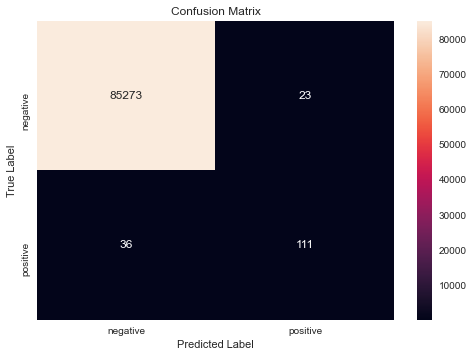

In [21]:
evalu(y_test,Dtree_pred)

## 99.931% accuracy means nothing in this case. A high recall is valued here even at a cost of having low precision.

In [22]:
## Testing the sampled data.

lb = LabelBinarizer() 

y_random_sample= np.array([number[0] for number in lb.fit_transform(y_random_sample)])

Dtree_clf_sample = DecisionTreeClassifier(criterion='entropy',max_depth=5, min_samples_split=25) # Using the best parameters obtained by Randomsearch
Dtree_clf_sample.fit(X_ramdom_sample,y_random_sample.tolist()) #Fitting the sampled data
Dtree_pred_sample = Dtree_clf_sample.predict(X_test)           #Testing the sampled data model on the test set.


Accuracy on test set: 93.595%
Precision on test set: 0.023
Recall on test set: 0.884
F1-Score on test set: 0.045
ROC- AUC on test set: 0.910


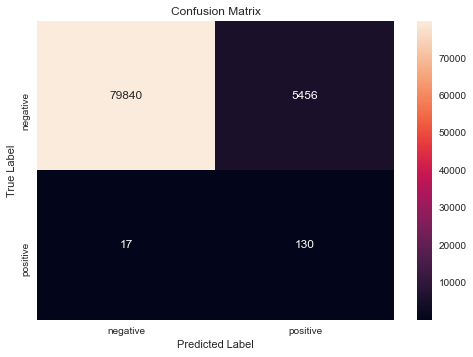

In [23]:
evalu(y_test,Dtree_pred_sample)

## A high recall is desired.
#The ROC-AUC is more for  this model, it means it is doing good.
## Precision is low but that is okay since credit card models allow to have less Precision.

In [61]:
dict(zip(X_train.columns,Dtree_clf_sample.feature_importances_))

#V14 is the root node and the most important node according to this classifier.

{'Time': 0.01364254362848744,
 'V1': 0.0,
 'V2': 0.0,
 'V3': 0.02810118493727328,
 'V4': 0.06890398195427698,
 'V5': 0.0,
 'V6': 0.0,
 'V7': 0.0,
 'V8': 0.0,
 'V9': 0.0,
 'V10': 0.04973036580272427,
 'V11': 0.0,
 'V12': 0.0263709052573387,
 'V13': 0.01272191739209565,
 'V14': 0.7447221064994083,
 'V15': 0.0,
 'V16': 0.0,
 'V17': 0.027007819981906607,
 'V18': 0.0,
 'V19': 0.0,
 'V20': 0.011383699881298231,
 'V21': 0.0,
 'V22': 0.0,
 'V23': 0.0,
 'V24': 0.0,
 'V25': 0.0,
 'V26': 0.0,
 'V27': 0.0,
 'V28': 0.0,
 'Amount': 0.017415474665190445}

[Text(298.92857142857144, 830.5, 'V14 <= -1.582\nentropy = 1.0\nsamples = 690\nvalue = [345, 345]\nclass = 0'),
 Text(88.57142857142857, 679.5, 'V10 <= -0.952\nentropy = 0.171\nsamples = 315\nvalue = [8, 307]\nclass = 1'),
 Text(44.285714285714285, 528.5, 'entropy = 0.0\nsamples = 289\nvalue = [0, 289]\nclass = 1'),
 Text(132.85714285714286, 528.5, 'V4 <= 1.886\nentropy = 0.89\nsamples = 26\nvalue = [8, 18]\nclass = 1'),
 Text(88.57142857142857, 377.5, 'entropy = 0.811\nsamples = 8\nvalue = [6, 2]\nclass = 0'),
 Text(177.14285714285714, 377.5, 'entropy = 0.503\nsamples = 18\nvalue = [2, 16]\nclass = 1'),
 Text(509.2857142857143, 679.5, 'V4 <= 0.813\nentropy = 0.473\nsamples = 375\nvalue = [337, 38]\nclass = 0'),
 Text(310.0, 528.5, 'V17 <= -0.055\nentropy = 0.193\nsamples = 270\nvalue = [262, 8]\nclass = 0'),
 Text(265.7142857142857, 377.5, 'entropy = 0.0\nsamples = 134\nvalue = [134, 0]\nclass = 0'),
 Text(354.2857142857143, 377.5, 'V17 <= -0.049\nentropy = 0.323\nsamples = 136\nvalue

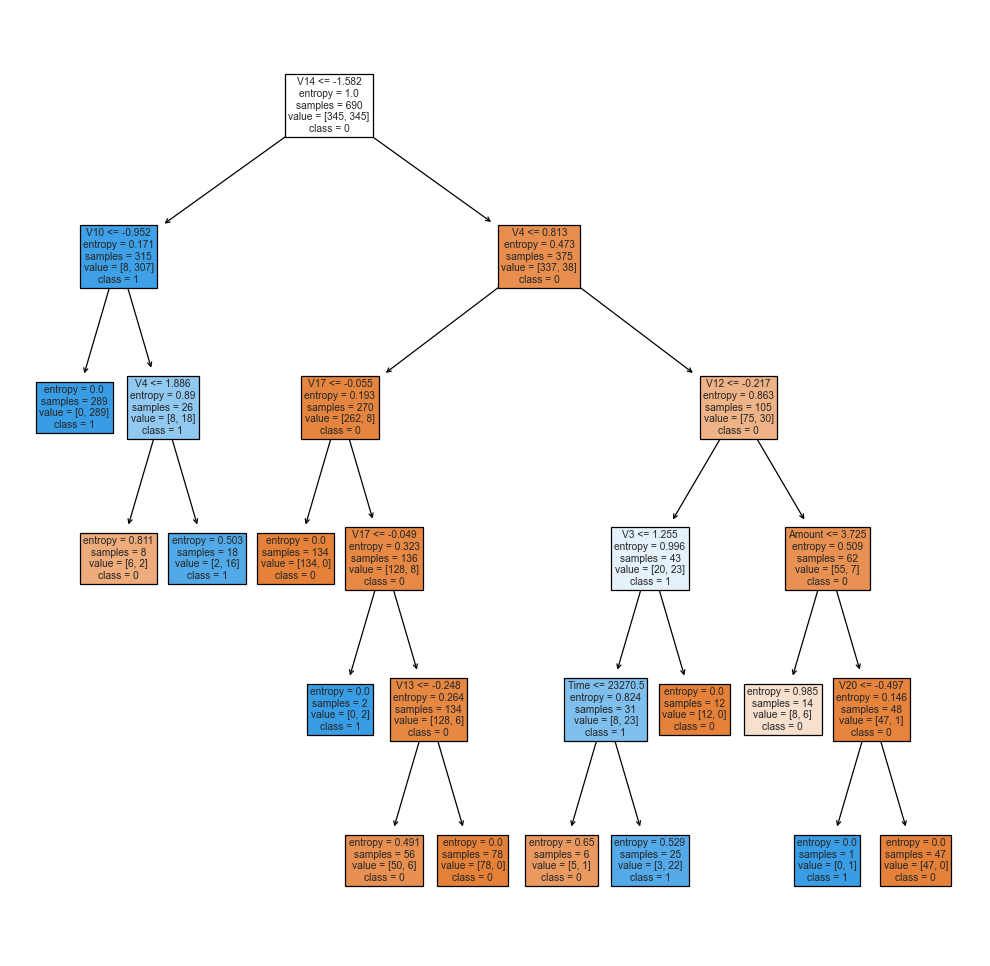

In [52]:
## Tree visualization according to the Decision tree built on the random undersampled data.

from sklearn import tree

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=300)
tree.plot_tree(Dtree_clf_sample,
               feature_names =['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount'], 
               class_names=['0','1'],
               filled = True)

#fig.savefig('imagename.png')

#https://towardsdatascience.com/visualizing-decision-trees-with-python-scikit-learn-graphviz-matplotlib-1c50b4aa68dc

## Random Forest

In [10]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html#sklearn.ensemble.RandomForestClassifier

In [11]:

def random(y_train,X_train): # Defining a function
    
    lb = LabelBinarizer() 
    y_train = np.array([number[0] for number in lb.fit_transform(y_train)]) 
  


    R_Forest =RandomForestClassifier() 

    param = {'n_estimators':[5,10,15,20,25,30,35,40,45,50,55,60],'max_depth':[1,2,3,4,5,6,7,8,9],'min_samples_split':[10,13,15,18,20,21,22,23,24,25,28,31,35,50],
            'criterion':['gini', 'entropy']}
    
    random_Rforest = RandomizedSearchCV(R_Forest,param,cv=5,verbose=1,scoring= 'recall',n_jobs=-1)
    random_Rforest.fit(X_train,y_train)
    print("Best HyperParameter: ",random_Rforest.best_params_)
    print("Accuracy Obtained: %.2f%%"%(random_Rforest.best_score_*100))

In [37]:
random_tree=random(y_train,X_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.9min finished


Best HyperParameter:  {'n_estimators': 15, 'min_samples_split': 22, 'max_depth': 9, 'criterion': 'entropy'}
Accuracy Obtained: 77.68%


In [38]:
## Training the full train dataset.

lb = LabelBinarizer() 


y_test= np.array([number[0] for number in lb.fit_transform(y_test)])

RF_clf = RandomForestClassifier(n_estimators=15, criterion='entropy',max_depth=9, min_samples_split=22)
RF_clf.fit(X_train,y_train.tolist())
RF_pred = RF_clf.predict(X_test)

# The below are the results of the tuning parameters(don't bother this).
#18minsplit,depth5,gini

Accuracy on test set: 99.946%
Precision on test set: 0.932
Recall on test set: 0.741
F1-Score on test set: 0.826
ROC- AUC on test set: 0.871


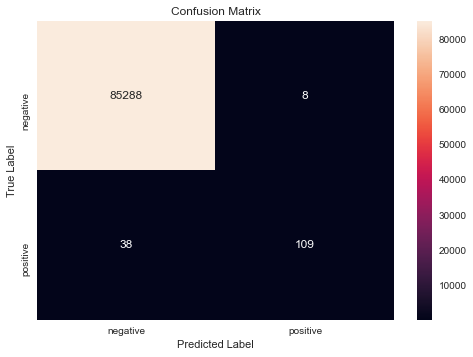

In [40]:
evalu(y_test,RF_pred)


In [41]:
## Testing the sampled data.

lb = LabelBinarizer() 

y_random_sample= np.array([number[0] for number in lb.fit_transform(y_random_sample)])

RF_clf_sample =  RandomForestClassifier(n_estimators=15, criterion='entropy',max_depth=9, min_samples_split=22)  
RF_clf_sample.fit(X_ramdom_sample,y_random_sample.tolist()) #Fitting the sampled data
rf_pred_sample = RF_clf_sample.predict(X_test)           #Testing the sampled data model on the test set.


Accuracy on test set: 96.178%
Precision on test set: 0.038
Recall on test set: 0.884
F1-Score on test set: 0.074
ROC- AUC on test set: 0.923


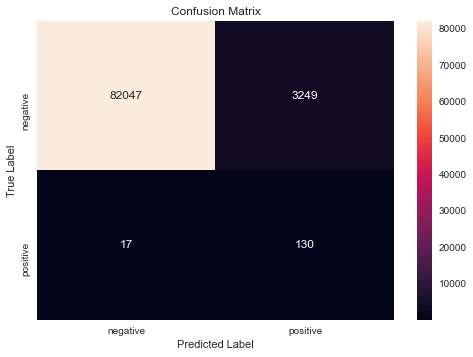

In [42]:
evalu(y_test,rf_pred_sample)

## A high recall is desired.
#The ROC-AUC is more for  this model, it means it is doing good.
## Precision is low but that is okay since credit card models allow to have less Precision.

In [54]:

fig, axes = plt.subplots(nrows = 1,ncols = 15,figsize = (10,2), dpi=3000)

for index in range(0, 15):
    tree.plot_tree(RF_clf_sample.estimators_[index],
                  feature_names =['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount'], 
               class_names=['0','1'],
                   filled = True,
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
#fig.savefig('rf_5trees.png')

## Logistic Regression

In [14]:
## Logistic Regression

# Scaling the data is important for Logistic Regression but not for Decision Tree/ Random Forest.

from sklearn import preprocessing 
from sklearn.preprocessing import StandardScaler

X_train=StandardScaler(with_mean=False).fit_transform(X_train)
X_test=StandardScaler(with_mean=False).fit_transform(X_test)
X_ramdom_sample=StandardScaler(with_mean=False).fit_transform(X_ramdom_sample)

In [13]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelBinarizer

def logit(X_train,y_train):
    
    lb = LabelBinarizer() 
    y_train = np.array([number[0] for number in lb.fit_transform(y_train)]) 
   

    lr = LogisticRegression().

    param = {'C':[50,10,1,0.1,0.05,0.01,0.005,0.001,0.0005,0.0001], # List of 'C' values. 
             'penalty':['l1','l2']} # Both the regularization terms.
    random_lr = RandomizedSearchCV(lr,param,cv=5,verbose=1,scoring= 'recall',n_jobs=-1) # Since all data is imbalanced, accuracy can't be used as scoring metric, so we can use metrics like precision, recall, f1 or roc_auc.
    random_lr.fit(X_train,y_train)
    print("Best HyperParameter: ",random_lr.best_params_)
    print("Best Accuracy: %.2f%%"%(random_lr.best_score_*100))

In [26]:
Logistic=logit(X_train,y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   24.8s finished


Best HyperParameter:  {'C': 0.05, 'penalty': 'l2'}
Best Accuracy: 91.59%


In [27]:
#Testing Accuracy on Test data

lb = LabelBinarizer()
y_train = np.array([number[0] for number in lb.fit_transform(y_train)]) 

lr_clf = LogisticRegression(C= 0.05, penalty= 'l2') 
lr_clf.fit(X_train,y_train)
lr_pred = lr_clf.predict(X_test)


Accuracy on test set: 99.910%
Precision on test set: 0.850
Recall on test set: 0.578
F1-Score on test set: 0.688
ROC- AUC on test set: 0.789


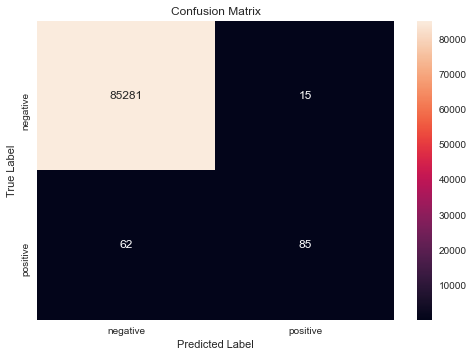

In [28]:
evalu(y_test,lr_pred)

In [ ]:
## Training the sampled data.

In [29]:
lb = LabelBinarizer() 

y_random_sample= np.array([number[0] for number in lb.fit_transform(y_random_sample)])

lr_clf_sample =  LogisticRegression(C= 0.05, penalty= 'l2')
lr_clf_sample.fit(X_ramdom_sample,y_random_sample.tolist()) 
lr_pred_sample = lr_clf_sample.predict(X_test)          


Accuracy on test set: 93.740%
Precision on test set: 0.025
Recall on test set: 0.932
F1-Score on test set: 0.049
ROC- AUC on test set: 0.935


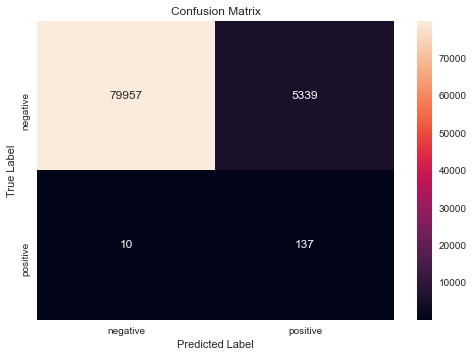

In [30]:
evalu(y_test,lr_pred_sample)

# See how the Recall and ROC-AUC Score increased dramatically with the model trained on Random Undersampled Data.

## SVM

In [126]:
#from sklearn.linear_model import SGDClassifier
#from sklearn.svm import SVC

In [1]:
# It is very important to find the optimal parameters before applying any algorithm on the data.
#def svm(y_train,x_train): # Defining a function
 #   
  #  lb = LabelBinarizer() 
   # y_train = np.array([number[0] for number in lb.fit_transform(y_train)]) 
    #y_test= np.array([number[0] for number in lb.fit_transform(y_test)])


    #svm_rbf =SVC(kernel='rbf') # class_weight is set to 'balanced' because data is imbalanced. We can also give a dict of values if we want.

    #param = {'C':[0.0001,0.001,0.05,3,5,7,10,15,17,20], # List of 'alpha' values. 
    #         'gamma':[0.0005,0.0001,0.005,0.3,0.1]} # the regularization terms.
    
  #  grid_svm_rbf = RandomizedSearchCV(svm_rbf,param,cv=5,verbose=1,scoring= 'recall',n_jobs=-1) # Since all data is imbalanced, accuracy can't be used as scoring metric, so we can use metrics like precision, recall, f1 or roc_auc.
  #  grid_svm_rbf.fit(X_train,y_train)
  #  print("Best HyperParameter: ",grid_svm_rbf.best_params_) # We get the best C and penality.
  #  print("Accuracy Obtained: %.2f%%"%(grid_svm_rbf.best_score_*100))

In [2]:
#SVM=svm(y_train,X_train)

## 2. Undersampling using Condensed Nearest Neighbours

1. Extracts observations from the majority class that are located at the boundary of the classes. 

In [30]:
%%time

from imblearn.under_sampling import CondensedNearestNeighbour

condensed_sampling = CondensedNearestNeighbour(sampling_strategy='auto', random_state=0,  n_neighbors=1,n_jobs=-1) 
X_CNN_sample, y_CNN_sample = condensed_sampling.fit_resample(X_train, y_train)

#https://imbalanced-learn.org/stable/under_sampling.html

Wall time: 5h 58min 33s


In [76]:
X_CNN_sample.shape,y_CNN_sample.shape

((2167, 30), (2167,))

In [79]:
y_CNN_sample

array([0, 0, 0, ..., 1, 1, 1])

### Decision Tree using CNN Sample

In [19]:
## Training and testing the CNN model(sampled data).

def sampletrainDtree(y,X):
    lb = LabelBinarizer() 

    y= np.array([number[0] for number in lb.fit_transform(y)])

    clf = DecisionTreeClassifier(criterion='entropy',max_depth=5, min_samples_split=28) # Using the best parameters obtained by Randomsearch
    clf.fit(X,y.tolist()) #Fitting the sampled data
    pred = clf.predict(X_test)         #Testing the sampled data model on the test set.
    
    return(pred)

In [81]:
DT_CNN=sampletrainDtree(y_CNN_sample,X_CNN_sample)

Accuracy on test set: 98.226%
Precision on test set: 0.077
Recall on test set: 0.850
F1-Score on test set: 0.142
ROC- AUC on test set: 0.916


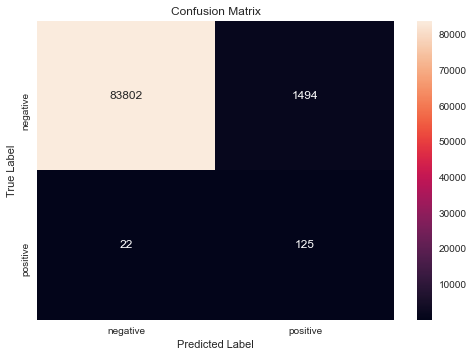

In [82]:
evalu(y_test,DT_CNN)

### Random Forest using CNN Sampling Method

In [20]:

def sampletrainRandomForest(y,X):


    lb = LabelBinarizer() 

    y = np.array([number[0] for number in lb.fit_transform(y)]) 
    
    clf = RandomForestClassifier(n_estimators=15, criterion='entropy',max_depth=9, min_samples_split=22) # Using the best parameters obtained by Randomsearch
    clf.fit(X,y.tolist())
    pred = clf.predict(X_test)
    
    return pred

In [84]:
RF_CNN=sampletrainRandomForest(y_CNN_sample,X_CNN_sample)

Accuracy on test set: 99.853%
Precision on test set: 0.548
Recall on test set: 0.823
F1-Score on test set: 0.658
ROC- AUC on test set: 0.911


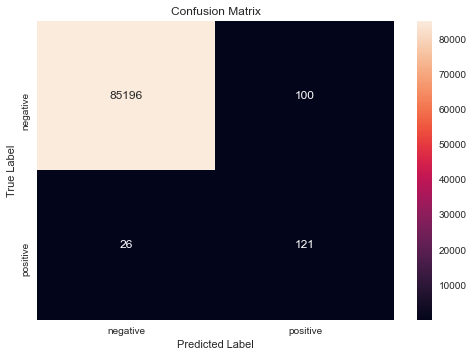

In [85]:
evalu(y_test,RF_CNN)

### Logistic Regression using CNN sampling Method

In [21]:
from sklearn.linear_model import LogisticRegression

def sampletrainLogit(y,X):
    
    lb = LabelBinarizer() 

    y= np.array([number[0] for number in lb.fit_transform(y)])

    clf =  LogisticRegression(C= 0.05, penalty= 'l2') # Using the best parameters obtained by Randomsearch
    clf.fit(X,y.tolist())       # Fitting the sampled data
    pred = clf.predict(X_test)                 # Testing the sampled data model on the test set.
    
    return pred

In [97]:
Logit_CNN=sampletrainLogit(y_CNN_sample,X_CNN_sample)

Accuracy on test set: 98.944%
Precision on test set: 0.121
Recall on test set: 0.823
F1-Score on test set: 0.212
ROC- AUC on test set: 0.906


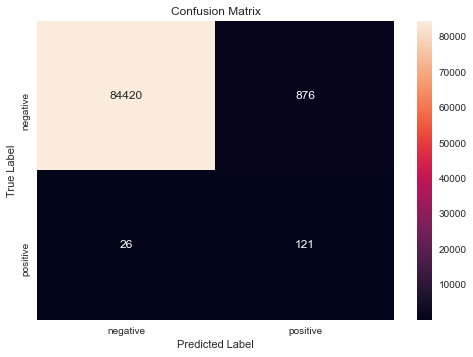

In [98]:
evalu(y_test,Logit_CNN)

## 3. Tomek Links

In [53]:
%%time

from imblearn.under_sampling import TomekLinks

tomek_sample=TomekLinks(sampling_strategy='auto',n_jobs=-1) #if sampling_strategy='all', then it will remove both the classes(tomek links)

X_tomek_sample, y_tomek_sample = tomek_sample.fit_resample(X_train, y_train)


#https://imbalanced-learn.org/stable/under_sampling.html

Wall time: 20min 31s


In [90]:
X_tomek_sample.shape,y_tomek_sample.shape

((199304, 30), (199304,))

In [102]:
len(X_train)-len(X_tomek_sample) #There are 60 tomek links.

60

### Decision Tree training on Tomek Link Sample

In [93]:
DT_Tomek=sampletrainDtree(y_tomek_sample,X_tomek_sample)

Accuracy on test set: 99.937%
Precision on test set: 0.855
Recall on test set: 0.762
F1-Score on test set: 0.806
ROC- AUC on test set: 0.881


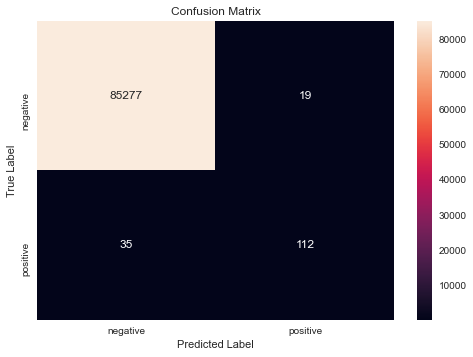

In [94]:
evalu(y_test,DT_Tomek)

### Random Forest on Tomek Link Sample

In [95]:
RF_Tomek=sampletrainRandomForest(y_tomek_sample,X_tomek_sample)

Accuracy on test set: 99.947%
Precision on test set: 0.964
Recall on test set: 0.721
F1-Score on test set: 0.825
ROC- AUC on test set: 0.861


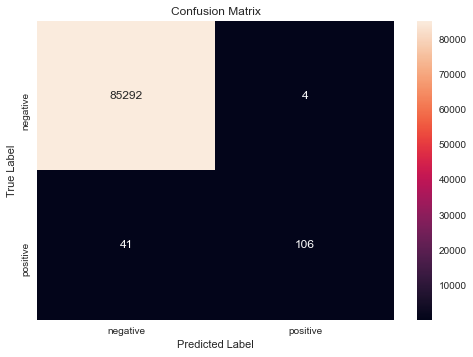

In [96]:
evalu(y_test,RF_Tomek)

### Logistic Regression on Tomek Link Sample 

In [99]:
Logit_Tomek=sampletrainLogit(y_tomek_sample,X_tomek_sample)

C:\Users\gnr04\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Accuracy on test set: 99.888%
Precision on test set: 0.681
Recall on test set: 0.653
F1-Score on test set: 0.667
ROC- AUC on test set: 0.826


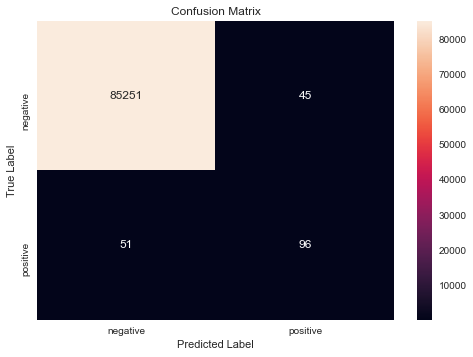

In [100]:
evalu(y_test,Logit_Tomek)

## 4. One Sided Selection

In [108]:
%%time

from imblearn.under_sampling import OneSidedSelection

Onesided_Sample=OneSidedSelection(sampling_strategy='auto',
    random_state=0,
    n_neighbors=1,
    n_jobs=-1)

X_OSS_sample, y_OSS_sample = Onesided_Sample.fit_resample(X_train, y_train)

#https://imbalanced-learn.org/stable/under_sampling.html

Wall time: 10min 46s


In [112]:
y_OSS_sample.value_counts()

0    198670
1       345
Name: Class, dtype: int64

### Decision Tree on the One sided Selection Sampling Method.

In [113]:
DT_oss=sampletrainDtree(y_OSS_sample,X_OSS_sample)

Accuracy on test set: 99.937%
Precision on test set: 0.855
Recall on test set: 0.762
F1-Score on test set: 0.806
ROC- AUC on test set: 0.881


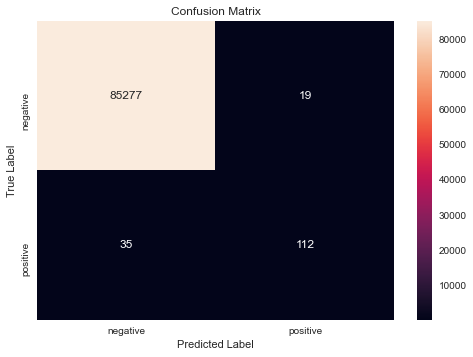

In [114]:
evalu(y_test,DT_oss)

### Random Forest on the one Sided Slection Sampling Method

In [115]:
RF_oss=sampletrainRandomForest(y_OSS_sample,X_OSS_sample)

Accuracy on test set: 99.944%
Precision on test set: 0.946
Recall on test set: 0.714
F1-Score on test set: 0.814
ROC- AUC on test set: 0.857


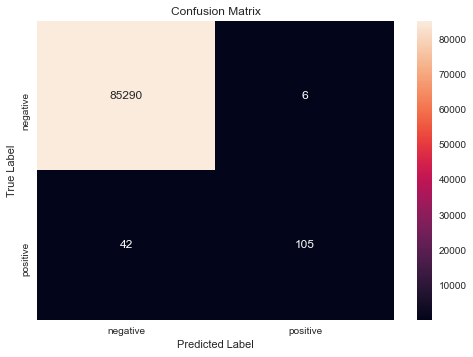

In [116]:
evalu(y_test,RF_oss)

### Logistic Regression om the One Sided Selection Sampling Method

In [118]:
Logit_oss=sampletrainLogit(y_OSS_sample,X_OSS_sample)

C:\Users\gnr04\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Accuracy on test set: 99.898%
Precision on test set: 0.695
Recall on test set: 0.728
F1-Score on test set: 0.711
ROC- AUC on test set: 0.864


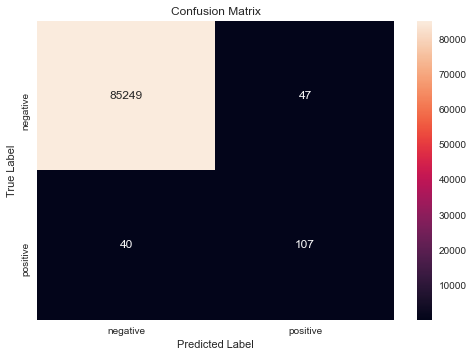

In [119]:
evalu(y_test,Logit_oss)

## 5. Edited Nearest Neighbors

1. It trains 3-NN initially on the entire data.
2. Eliminate the point even if one of the class is from an opposite class.

In [45]:
%%time

from imblearn.under_sampling import EditedNearestNeighbours

ENN_Sample=EditedNearestNeighbours(sampling_strategy='auto',
    n_neighbors=3,
    kind_sel='all',
    n_jobs=-1)

X_ENN_sample, y_ENN_sample = ENN_Sample.fit_resample(X_train, y_train)

#https://imbalanced-learn.org/stable/under_sampling.html

Wall time: 27min 26s


In [125]:
y_ENN_sample.value_counts()

0    198699
1       345
Name: Class, dtype: int64

### Decision Tree on Edited Nearest Neighbors

In [126]:
DT_ENN=sampletrainDtree(y_ENN_sample,X_ENN_sample)

Accuracy on test set: 99.937%
Precision on test set: 0.855
Recall on test set: 0.762
F1-Score on test set: 0.806
ROC- AUC on test set: 0.881


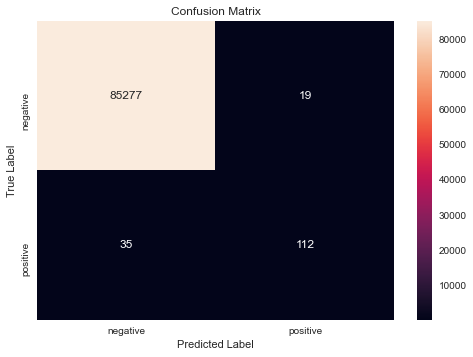

In [127]:
evalu(y_test,DT_ENN)

### Random Forest on Edited Nearest Neighbors

In [129]:
RF_ENN=sampletrainRandomForest(y_ENN_sample,X_ENN_sample)

Accuracy on test set: 99.941%
Precision on test set: 0.929
Recall on test set: 0.714
F1-Score on test set: 0.808
ROC- AUC on test set: 0.857


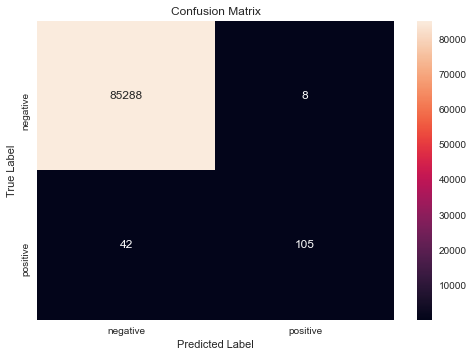

In [131]:
evalu(y_test,RF_ENN)

### Logistic Regression on the Edited Nearest Neighbors.

In [132]:
Logit_ENN=sampletrainLogit(y_ENN_sample,X_ENN_sample)

Accuracy on test set: 99.888%
Precision on test set: 0.676
Recall on test set: 0.667
F1-Score on test set: 0.671
ROC- AUC on test set: 0.833


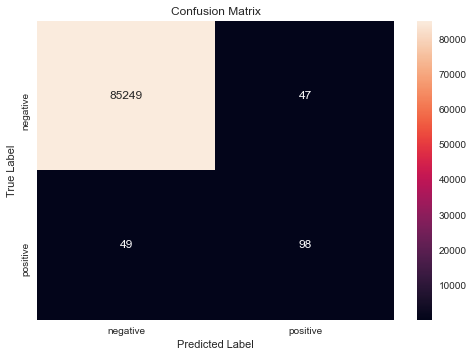

In [133]:
evalu(y_test,Logit_ENN)

## 6. Repeated Edited Nearest Neighbors

In [136]:
%%time

from imblearn.under_sampling import RepeatedEditedNearestNeighbours

RENN_Sample=RepeatedEditedNearestNeighbours(sampling_strategy='auto',
    n_neighbors=3,
    kind_sel='all',
    n_jobs=-1,
    max_iter=50)

X_RENN_sample, y_RENN_sample = RENN_Sample.fit_resample(X_train, y_train)

#https://imbalanced-learn.org/stable/under_sampling.html

Wall time: 2h 22min 28s


### Decision Tree on Edited Nearset Neighbors

In [137]:
DT_RENN=sampletrainDtree(y_RENN_sample,X_RENN_sample)

Accuracy on test set: 99.937%
Precision on test set: 0.855
Recall on test set: 0.762
F1-Score on test set: 0.806
ROC- AUC on test set: 0.881


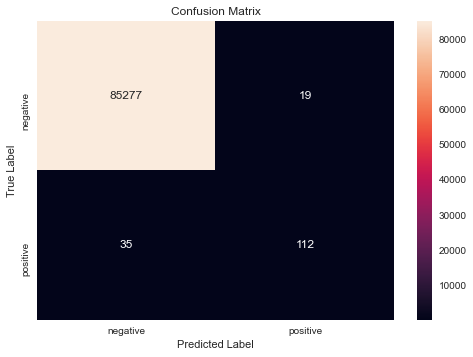

In [138]:
evalu(y_test,DT_RENN)

### Random Forest in Edited Nearest Neighbors

In [139]:
RF_RENN=sampletrainRandomForest(y_RENN_sample,X_RENN_sample)

Accuracy on test set: 99.943%
Precision on test set: 0.938
Recall on test set: 0.714
F1-Score on test set: 0.811
ROC- AUC on test set: 0.857


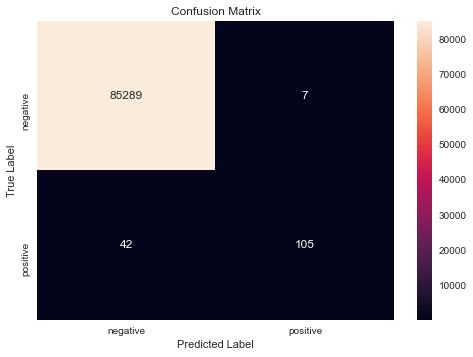

In [140]:
evalu(y_test,RF_RENN)

### Logistic Regression on Edited Nearest Neighbors

In [141]:
Logit_RENN=sampletrainLogit(y_RENN_sample,X_RENN_sample)

C:\Users\gnr04\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Accuracy on test set: 99.899%
Precision on test set: 0.723
Recall on test set: 0.673
F1-Score on test set: 0.697
ROC- AUC on test set: 0.837


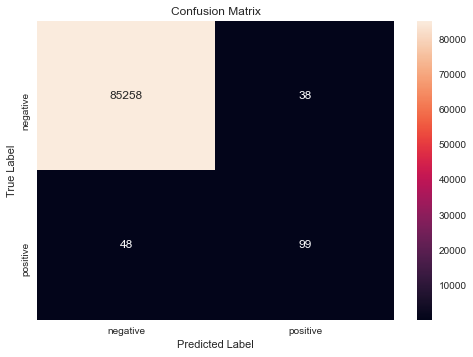

In [142]:
evalu(y_test,Logit_RENN)

## 7. All KNN

In [143]:
%%time

from imblearn.under_sampling import AllKNN

AllKNN_Sample=AllKNN(sampling_strategy='auto',
    n_neighbors=3,
    kind_sel='all',
    n_jobs=-1)

X_KNN_sample, y_KNN_sample = AllKNN_Sample.fit_resample(X_train, y_train)

#https://imbalanced-learn.org/stable/under_sampling.html

Wall time: 1h 20min 12s


### Decision Tree on AllKNN Technique

In [144]:
DT_AllKNN=sampletrainDtree(y_KNN_sample,X_KNN_sample)

Accuracy on test set: 99.937%
Precision on test set: 0.855
Recall on test set: 0.762
F1-Score on test set: 0.806
ROC- AUC on test set: 0.881


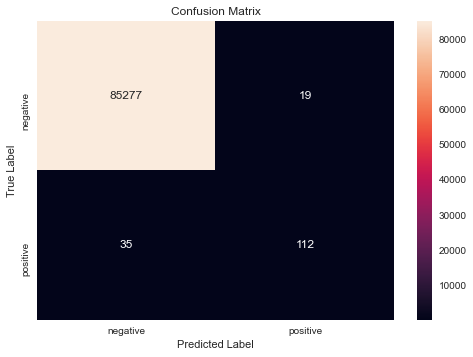

In [145]:
evalu(y_test,DT_AllKNN)

### Random Forest On All Knn Technique

In [146]:
RF_AllKNN=sampletrainRandomForest(y_KNN_sample,X_KNN_sample)

Accuracy on test set: 99.943%
Precision on test set: 0.930
Recall on test set: 0.721
F1-Score on test set: 0.812
ROC- AUC on test set: 0.860


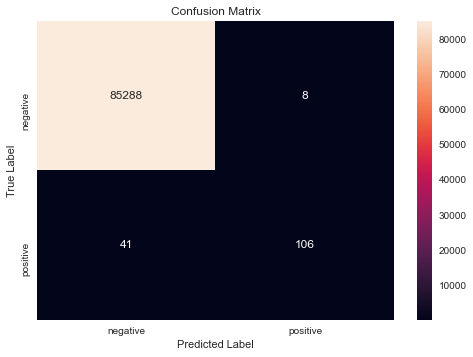

In [147]:
evalu(y_test,RF_AllKNN)

### Logistic Regression on All KNN Technique

In [148]:
Logit_AllKNN=sampletrainLogit(y_KNN_sample,X_KNN_sample)

C:\Users\gnr04\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Accuracy on test set: 99.891%
Precision on test set: 0.693
Recall on test set: 0.660
F1-Score on test set: 0.676
ROC- AUC on test set: 0.830


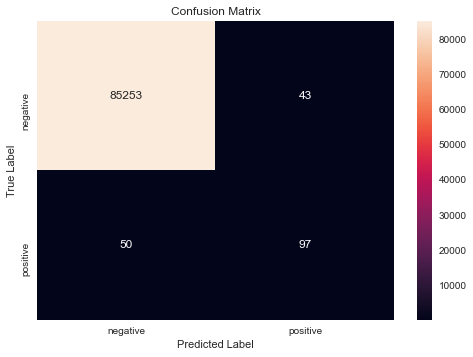

In [149]:
evalu(y_test,Logit_AllKNN)

## 8. Neighborhood Cleaning Rule

In [153]:
%%time

from imblearn.under_sampling import NeighbourhoodCleaningRule

NeighbourCleanning_Sample=NeighbourhoodCleaningRule(sampling_strategy='auto',
    n_neighbors=3,
    kind_sel='all',
    n_jobs=-1,
    threshold_cleaning=0.5)

X_NCL_sample, y_NCL_sample = NeighbourCleanning_Sample.fit_resample(X_train, y_train)

#https://imbalanced-learn.org/stable/under_sampling.html

Wall time: 24min 2s


### Decision Tree on Neighbourhood Cleaning Rule

In [154]:
DT_NCL=sampletrainDtree(y_NCL_sample,X_NCL_sample)

Accuracy on test set: 99.937%
Precision on test set: 0.855
Recall on test set: 0.762
F1-Score on test set: 0.806
ROC- AUC on test set: 0.881


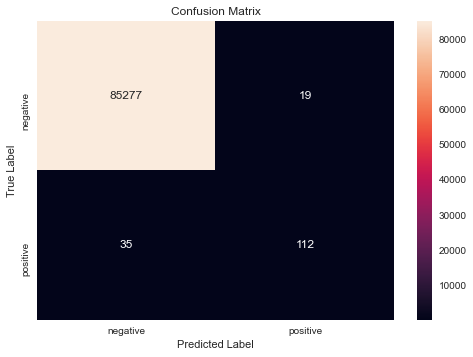

In [155]:
evalu(y_test,DT_NCL)

### Random Forest on Neighbourhood Cleaning Rule

In [156]:
RF_NCL=sampletrainRandomForest(y_NCL_sample,X_NCL_sample)

Accuracy on test set: 99.943%
Precision on test set: 0.945
Recall on test set: 0.707
F1-Score on test set: 0.809
ROC- AUC on test set: 0.854


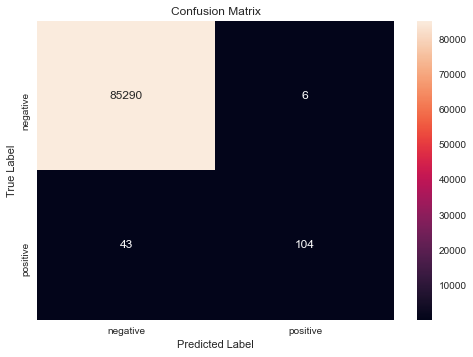

In [157]:
evalu(y_test,RF_NCL)

### Logistic Regression on Nearest Neighbourest 

In [158]:
Logit_NCL=sampletrainLogit(y_NCL_sample,X_NCL_sample)

C:\Users\gnr04\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Accuracy on test set: 99.888%
Precision on test set: 0.681
Recall on test set: 0.653
F1-Score on test set: 0.667
ROC- AUC on test set: 0.826


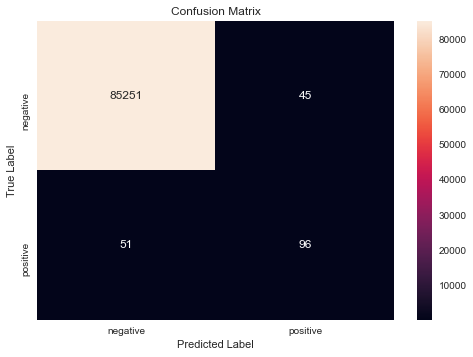

In [159]:
evalu(y_test,Logit_NCL)

## Oversampling

1. Creating synthetic data points from minority class to match the majority class lables until the desired balancing ratio is achieved.

2. Balancing is defined as: R(x)= X(minority)/X(majority)

## 1. Random Over Sampling

In [161]:
from imblearn.over_sampling import RandomOverSampler

randomover_sample=RandomOverSampler(sampling_strategy='auto', random_state=0)

X_randomover_sample,y_randomover_sample=randomover_sample.fit_resample(X_train,y_train)


In [165]:
y_randomover_sample.value_counts() #Has the same number of negative samples as the positive.

1    199019
0    199019
Name: Class, dtype: int64

### Decision Tree on the Random Over Sampled Data

In [168]:
DT_randomoverL=sampletrainDtree(y_randomover_sample,X_randomover_sample)

Accuracy on test set: 93.308%
Precision on test set: 0.022
Recall on test set: 0.884
F1-Score on test set: 0.043
ROC- AUC on test set: 0.909


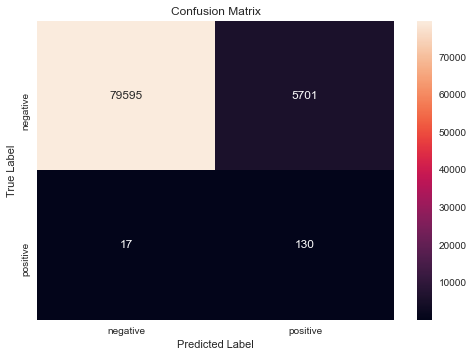

In [169]:
evalu(y_test,DT_randomoverL)

### Random Forest

In [170]:
RF_randomover=sampletrainRandomForest(y_randomover_sample,X_randomover_sample)

Accuracy on test set: 99.922%
Precision on test set: 0.760
Recall on test set: 0.796
F1-Score on test set: 0.777
ROC- AUC on test set: 0.898


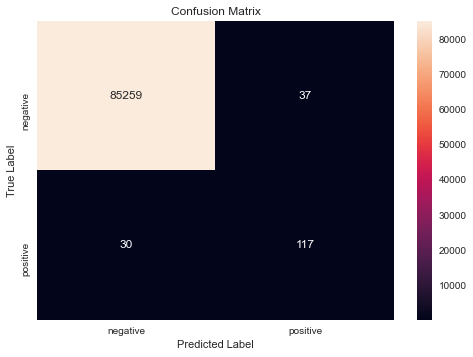

In [171]:
evalu(y_test,RF_randomover)

### Logistic Regression

In [173]:
Logit_randomover=sampletrainLogit(y_randomover_sample,X_randomover_sample)

C:\Users\gnr04\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Accuracy on test set: 96.457%
Precision on test set: 0.043
Recall on test set: 0.912
F1-Score on test set: 0.081
ROC- AUC on test set: 0.938


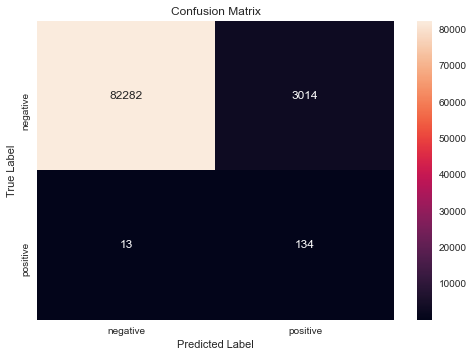

In [174]:
evalu(y_test,Logit_randomover)

## 2. SMOTE

In [43]:
%%time

from imblearn.over_sampling import SMOTE

SMOTE_Sample=SMOTE(sampling_strategy='auto',
    k_neighbors=5,
    n_jobs=-1)

X_SMOTE_sample, y_SMOTE_sample = SMOTE_Sample.fit_resample(X_train, y_train)

#https://imbalanced-learn.org/stable/under_sampling.html

Wall time: 410 ms


In [180]:
y_SMOTE_sample.value_counts()

1    199019
0    199019
Name: Class, dtype: int64

### Decision Tree on SMOTE

In [181]:
DT_SMOTE=sampletrainDtree(y_SMOTE_sample,X_SMOTE_sample)

Accuracy on test set: 97.580%
Precision on test set: 0.059
Recall on test set: 0.871
F1-Score on test set: 0.110
ROC- AUC on test set: 0.923


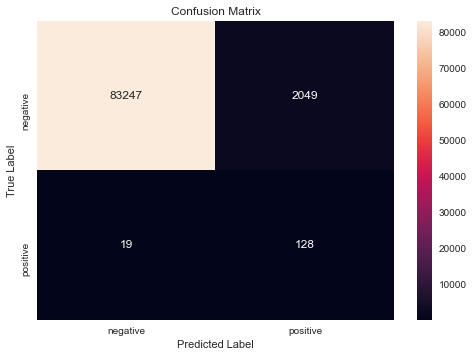

In [182]:
evalu(y_test,DT_SMOTE)

### Random Forest on SMOTE

In [183]:
RF_SMOTE=sampletrainRandomForest(y_SMOTE_sample,X_SMOTE_sample)

Accuracy on test set: 99.850%
Precision on test set: 0.543
Recall on test set: 0.823
F1-Score on test set: 0.654
ROC- AUC on test set: 0.911


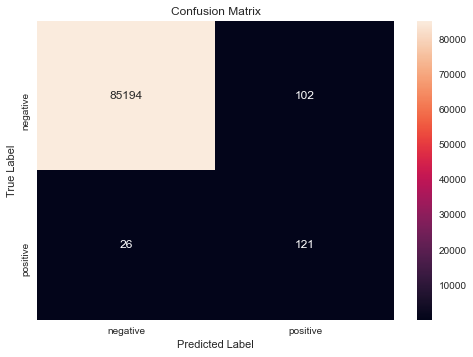

In [184]:
evalu(y_test,RF_SMOTE)

### Logistic Regression on SMOTE

In [185]:
Logit_SMOTE=sampletrainLogit(y_SMOTE_sample,X_SMOTE_sample)

C:\Users\gnr04\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Accuracy on test set: 98.428%
Precision on test set: 0.086
Recall on test set: 0.850
F1-Score on test set: 0.157
ROC- AUC on test set: 0.917


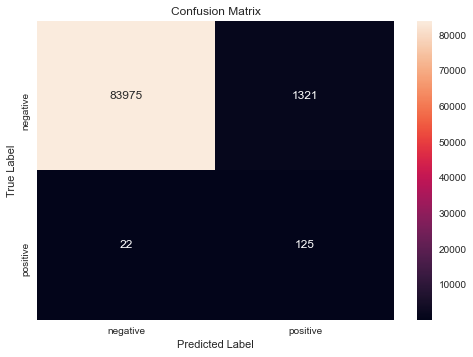

In [186]:
evalu(y_test,Logit_SMOTE)

## 3. ADASYN

In [15]:
%%time

from imblearn.over_sampling import ADASYN

ADASYN_Sample=ADASYN(sampling_strategy='auto',
    n_neighbors=5,
    n_jobs=-1)

X_ADASYN_Sample_sample, y_ADASYN_Sample_sample = ADASYN_Sample.fit_resample(X_train, y_train)

#https://imbalanced-learn.org/stable/under_sampling.html

Wall time: 4.75 s


### Decision Tree on ADASYN 

In [22]:
DT_ADASYN=sampletrainDtree(y_ADASYN_Sample_sample,X_ADASYN_Sample_sample)

Accuracy on test set: 89.450%
Precision on test set: 0.014
Recall on test set: 0.884
F1-Score on test set: 0.028
ROC- AUC on test set: 0.889


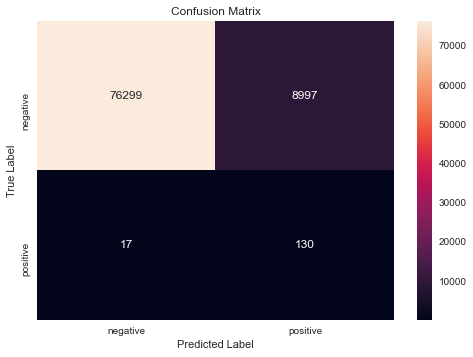

In [26]:
evalu(y_test,DT_ADASYN)

### Random Forest on ADASYN

In [27]:
RF_ADASYN=sampletrainRandomForest(y_ADASYN_Sample_sample,X_ADASYN_Sample_sample)

Accuracy on test set: 98.830%
Precision on test set: 0.114
Recall on test set: 0.857
F1-Score on test set: 0.201
ROC- AUC on test set: 0.923


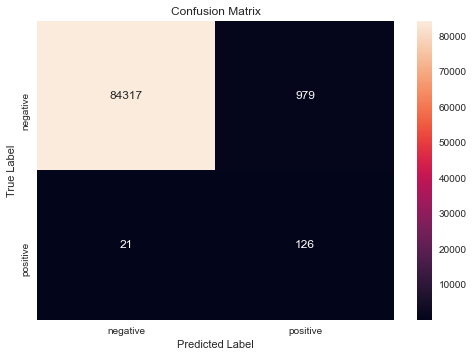

In [30]:
evalu(y_test,RF_ADASYN)

### Logistic Regression on ADASYN

In [29]:
Logit_ADASYN=sampletrainLogit(y_ADASYN_Sample_sample,X_ADASYN_Sample_sample)

Accuracy on test set: 91.296%
Precision on test set: 0.018
Recall on test set: 0.925
F1-Score on test set: 0.035
ROC- AUC on test set: 0.919


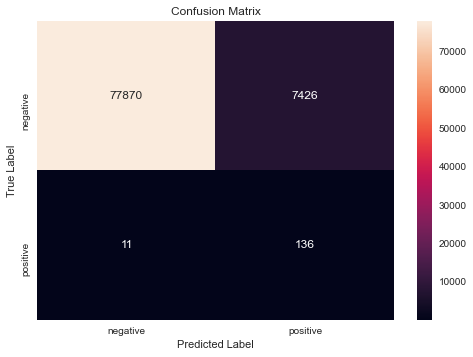

In [31]:
evalu(y_test,Logit_ADASYN)

## 4. Boderline SMOTE

In [32]:
%%time

from imblearn.over_sampling import BorderlineSMOTE

Borderline_Sample=BorderlineSMOTE(sampling_strategy='auto',
    k_neighbors=5,
    m_neighbors=10,
    kind="borderline-1",
    n_jobs=-1)

X_Borderline_sample, y_Borderline_sample = Borderline_Sample.fit_resample(X_train, y_train)

#https://imbalanced-learn.org/stable/under_sampling.html

Wall time: 4.22 s


### Decision Tree on Borderline SMOTE

In [33]:
DT_borderSMOTE=sampletrainDtree(y_Borderline_sample,X_Borderline_sample)

Accuracy on test set: 98.398%
Precision on test set: 0.083
Recall on test set: 0.823
F1-Score on test set: 0.150
ROC- AUC on test set: 0.904


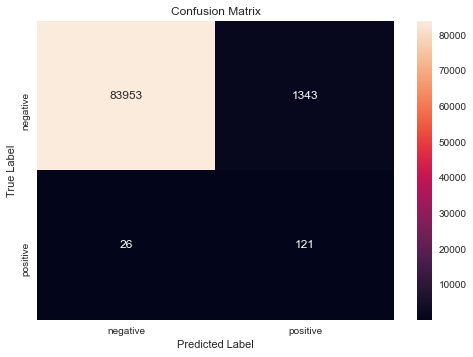

In [34]:
evalu(y_test,DT_borderSMOTE)

### Random Forest on Borderline SMOTE

In [35]:
RF_borderSMOTE=sampletrainRandomForest(y_Borderline_sample,X_Borderline_sample)

Accuracy on test set: 99.917%
Precision on test set: 0.744
Recall on test set: 0.789
F1-Score on test set: 0.766
ROC- AUC on test set: 0.894


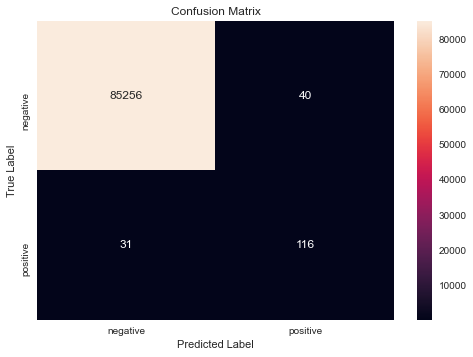

In [36]:
evalu(y_test,RF_borderSMOTE)

### Logistic Regression on Borderline SMOTE

In [37]:
Logit_borderSMOTE=sampletrainLogit(y_Borderline_sample,X_Borderline_sample)

Accuracy on test set: 99.340%
Precision on test set: 0.185
Recall on test set: 0.830
F1-Score on test set: 0.302
ROC- AUC on test set: 0.912


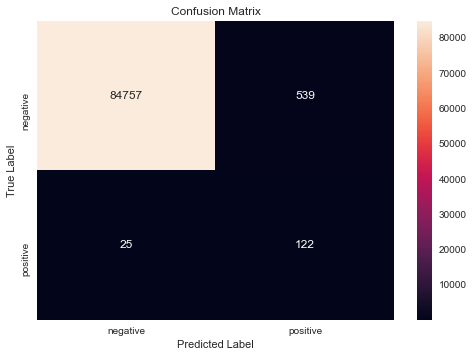

In [38]:
evalu(y_test,Logit_borderSMOTE)

## 5. SVM SMOTE

In [198]:
%%time

from imblearn.over_sampling import SVMSMOTE
from sklearn import svm

SVMSMOTE_Sample=SVMSMOTE(sampling_strategy='auto',
    k_neighbors=5,
    m_neighbors=10,
    svm_estimator=svm.SVC(kernel='linear'))

X_SVMSMOTE_Sample, y_SVMSMOTE_Sample = SVMSMOTE_Sample.fit_resample(X_train, y_train)

#https://imbalanced-learn.org/stable/under_sampling.html

Wall time: 14min 33s


## Hybrid Sampling- Over Sampling and Under Sampling

1. This technique is a hybrid of both Oversampling and Undersampling methods.

In [46]:
%%time

from imblearn.under_sampling import TomekLinks, EditedNearestNeighbours
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN,SMOTETomek


SMOTEENN_Sample=SMOTEENN(sampling_strategy='auto',
                        smote=SMOTE_Sample,
                        enn=ENN_Sample,
                        n_jobs=-1)
    

X_SMOTEENN_Sample, y_SMOTEENN_Sample = SMOTEENN_Sample.fit_resample(X_train, y_train)




Wall time: 49min 12s


### Decision Tree on Hybrid SMOTE-ENN 

In [47]:
DT_hybrid_SMOTE_ENN=sampletrainDtree(y_SMOTEENN_Sample,X_SMOTEENN_Sample)

Accuracy on test set: 96.652%
Precision on test set: 0.041
Recall on test set: 0.823
F1-Score on test set: 0.078
ROC- AUC on test set: 0.895


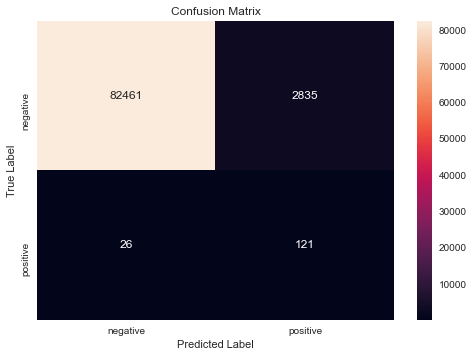

In [48]:
evalu(y_test,DT_hybrid_SMOTE_ENN)

### Random Forest on Hybrid SMOTE-ENN

In [49]:
RF_hybrid_SMOTE_ENN=sampletrainRandomForest(y_SMOTEENN_Sample,X_SMOTEENN_Sample)

Accuracy on test set: 99.706%
Precision on test set: 0.351
Recall on test set: 0.830
F1-Score on test set: 0.493
ROC- AUC on test set: 0.914


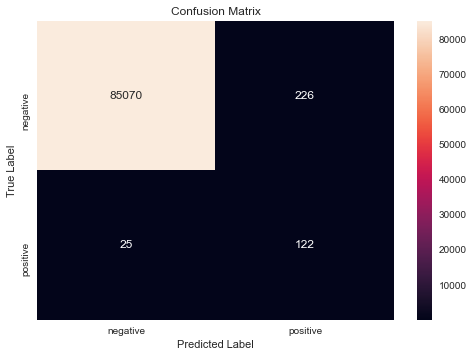

In [50]:
evalu(y_test,RF_hybrid_SMOTE_ENN)

### Logistic Regression on Hybrid SMOTE-ENN

In [51]:
Logit_hybrid_SMOTE_ENN=sampletrainLogit(y_SMOTEENN_Sample,X_SMOTEENN_Sample)

Accuracy on test set: 97.507%
Precision on test set: 0.058
Recall on test set: 0.891
F1-Score on test set: 0.110
ROC- AUC on test set: 0.933


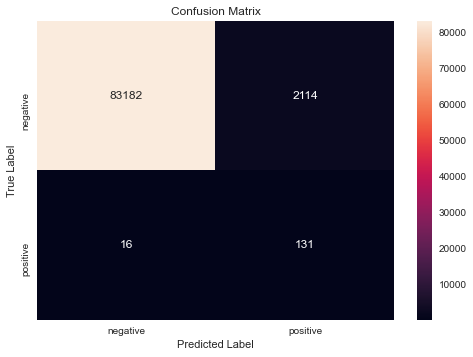

In [52]:
evalu(y_test,Logit_hybrid_SMOTE_ENN)

## SMOTE-TOMEK Hybrid Sampling Technique

In [55]:
SMOTETOMEK_Sample=SMOTETomek(sampling_strategy='auto',
                        smote=SMOTE_Sample,
                        tomek=tomek_sample,
                        n_jobs=-1)
    

X_SMOTETOMEK_Sample, y_SMOTETOMEK_Sample = SMOTETOMEK_Sample.fit_resample(X_train, y_train)


### Decision Tree on the SMOTE-TOMEK Hybrid

In [56]:
DT_hybrid_SMOTE_Tomek=sampletrainDtree(y_SMOTETOMEK_Sample,X_SMOTETOMEK_Sample)

Accuracy on test set: 96.571%
Precision on test set: 0.040
Recall on test set: 0.823
F1-Score on test set: 0.076
ROC- AUC on test set: 0.895


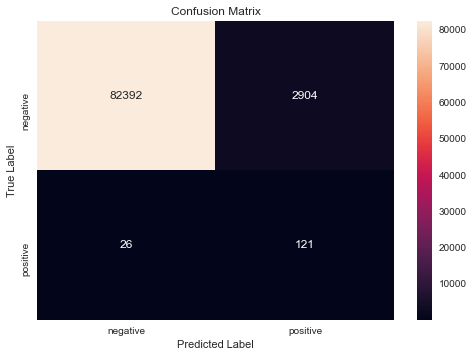

In [57]:
evalu(y_test,DT_hybrid_SMOTE_Tomek)

### Random Forest on the SMOTE-TOMEK Hybrid

In [58]:
RF_hybrid_SMOTE_Tomek=sampletrainRandomForest(y_SMOTETOMEK_Sample,X_SMOTETOMEK_Sample)

Accuracy on test set: 99.829%
Precision on test set: 0.502
Recall on test set: 0.830
F1-Score on test set: 0.626
ROC- AUC on test set: 0.914


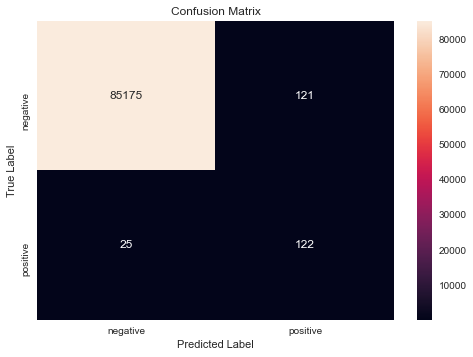

In [59]:
evalu(y_test,RF_hybrid_SMOTE_Tomek)

### Logistic Regression on the SMOTE-TOMEK Hybrid

In [60]:
Logit_hybrid_SMOTE_Tomek=sampletrainLogit(y_SMOTETOMEK_Sample,X_SMOTETOMEK_Sample)

Accuracy on test set: 97.534%
Precision on test set: 0.059
Recall on test set: 0.891
F1-Score on test set: 0.111
ROC- AUC on test set: 0.933


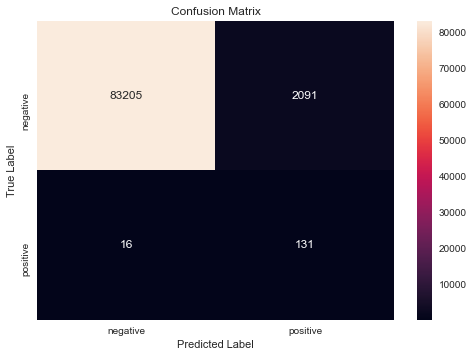

In [61]:
evalu(y_test,Logit_hybrid_SMOTE_Tomek)

## Cost Sensitive Learning - SKlean

In [214]:
(y_train.value_counts()/len(y_train))*100

0    99.82695
1     0.17305
Name: Class, dtype: float64

### Cost is set to None

In [215]:
lb = LabelBinarizer() 

y_test= np.array([number[0] for number in lb.fit_transform(y_test)])

Dtree_clf = DecisionTreeClassifier(criterion='entropy',max_depth=3, min_samples_split=28,class_weight=None) # Using the best parameters obtained by Randomsearch
Dtree_clf.fit(X_train,y_train.tolist())
Dtree_pred = Dtree_clf.predict(X_test)

Accuracy on test set: 99.931%
Precision on test set: 0.828
Recall on test set: 0.755
F1-Score on test set: 0.790
ROC- AUC on test set: 0.877


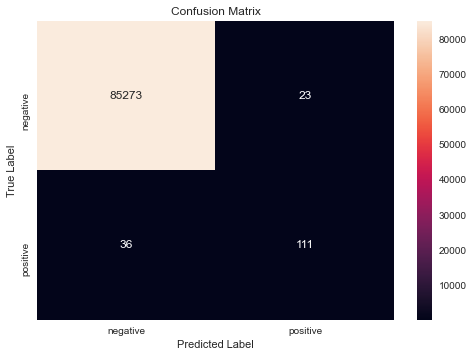

In [218]:
evalu(y_test,Dtree_pred)

### Class is set to Balance

In [225]:
lb = LabelBinarizer() 

y_test= np.array([number[0] for number in lb.fit_transform(y_test)])

Dtree_clf = DecisionTreeClassifier(criterion='entropy',max_depth=3, min_samples_split=28,class_weight='balanced') # Using the best parameters obtained by Randomsearch
Dtree_clf.fit(X_train,y_train.tolist())
Dtree_pred_balanced = Dtree_clf.predict(X_test)

Accuracy on test set: 95.852%
Precision on test set: 0.035
Recall on test set: 0.857
F1-Score on test set: 0.066
ROC- AUC on test set: 0.908


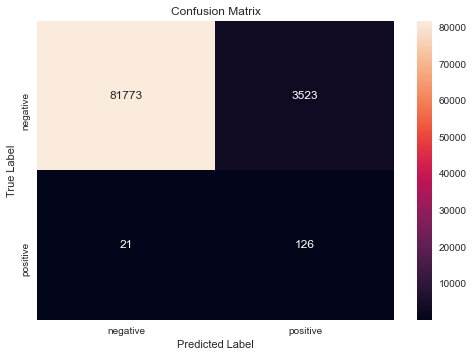

In [226]:
evalu(y_test,Dtree_pred_balanced)

### Manual Penality method

In [39]:
lb = LabelBinarizer() 

y_test= np.array([number[0] for number in lb.fit_transform(y_test)])

Dtree_clf = DecisionTreeClassifier(criterion='entropy',max_depth=3, min_samples_split=28,class_weight={0:1, 1:10}) # Using the best parameters obtained by Randomsearch
Dtree_clf.fit(X_train,y_train.tolist())
Dtree_pred_manual = Dtree_clf.predict(X_test)

Accuracy on test set: 99.889%
Precision on test set: 0.649
Recall on test set: 0.769
F1-Score on test set: 0.704
ROC- AUC on test set: 0.884


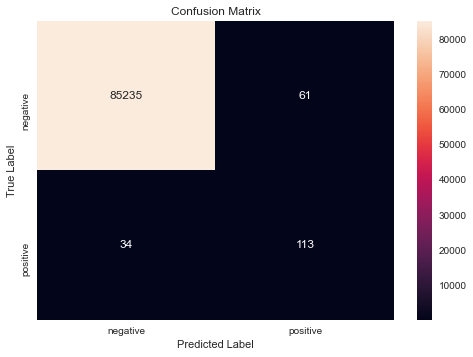

In [40]:
evalu(y_test,Dtree_pred_manual)

## References

https://machinelearningmastery.com/framework-for-imbalanced-classification-projects
#:https://github.com/srikanth199511